In [1]:
# Projekt analizy komunikacji publicznej dla miasta Nowy York
# Analiza przeprowadzona może posłużyć do określenia, które dzielnice Nowego Yorku są najlepiej skomunikowane
# W projekcie zostało uwzględnione jak długie trasy komunikacji miejskiej są w danych dzielnicach oraz jak dużo jest w nich przystanków
# Objęte zostały linie oraz przystanki metra oraz autobsów miejskich
# W każdym załączonym do projektu pliku znajdują się najważniejsze informacje o danym obiekcie oraz ich geometrie
# W projekcie widać liczne mapki przedstawiające dane pobrane z przygotowanych plików
# Dodatkowo każdy z kroków które zostały wykonane jest krótko opisany
# Pliki zostały pobrane ze strony https://geodata.lib.utexas.edu/?f%5Bdct_provenance_s%5D%5B%5D=Baruch+CUNY&page=6

In [2]:
# Pobranie danych z załączonych plików
import geopandas as gpd

boroughs = gpd.read_file("boroughs.shp")
subway_routes = gpd.read_file("subway_routes.shp")
subway_stops = gpd.GeoDataFrame(gpd.read_file("subway_stops.shp"))
bk_bus_routes = gpd.GeoDataFrame(gpd.read_file("bk_bus_routes.shp"))
bk_bus_stops = gpd.GeoDataFrame(gpd.read_file("bk_bus_stops.shp"))
bx_bus_routes = gpd.GeoDataFrame(gpd.read_file("bx_bus_routes.shp"))
bx_bus_stops = gpd.GeoDataFrame(gpd.read_file("bx_bus_stops.shp"))
eq_bus_routes = gpd.GeoDataFrame(gpd.read_file("eq_bus_routes.shp"))
eq_bus_stops = gpd.GeoDataFrame(gpd.read_file("eq_bus_stops.shp"))
mn_bus_routes = gpd.GeoDataFrame(gpd.read_file("mn_bus_routes.shp"))
mn_bus_stops = gpd.GeoDataFrame(gpd.read_file("mn_bus_stops.shp"))
si_bus_routes = gpd.GeoDataFrame(gpd.read_file("si_bus_routes.shp"))
si_bus_stops = gpd.GeoDataFrame(gpd.read_file("si_bus_stops.shp"))
wq_bus_routes = gpd.GeoDataFrame(gpd.read_file("wq_bus_routes.shp"))
wq_bus_stops = gpd.GeoDataFrame(gpd.read_file("wq_bus_stops.shp"))

In [3]:
# Ustawienie jednakowych wartości crs dla wszystkich danych
boroughs = boroughs.to_crs(epsg = 3857)

if not subway_routes.crs == boroughs.crs: 
    subway_routes = subway_routes.to_crs(epsg = 3857)
if not subway_stops.crs == boroughs.crs: 
    subway_stops = subway_stops.to_crs(epsg = 3857)
if not bk_bus_routes.crs == boroughs.crs: 
    bk_bus_routes = bk_bus_routes.to_crs(epsg = 3857)
if not bk_bus_stops.crs == boroughs.crs: 
    bk_bus_stops = bk_bus_stops.to_crs(epsg = 3857)
if not bx_bus_routes.crs == boroughs.crs: 
    bx_bus_routes = bx_bus_routes.to_crs(epsg = 3857)
if not bx_bus_stops.crs == boroughs.crs: 
    bx_bus_stops = bx_bus_stops.to_crs(epsg = 3857)
if not eq_bus_routes.crs == boroughs.crs: 
    eq_bus_routes = eq_bus_routes.to_crs(epsg = 3857)
if not eq_bus_stops.crs == boroughs.crs: 
    eq_bus_stops = eq_bus_stops.to_crs(epsg = 3857)
if not mn_bus_routes.crs == boroughs.crs: 
    mn_bus_routes = mn_bus_routes.to_crs(epsg = 3857)
if not mn_bus_stops.crs == boroughs.crs: 
    mn_bus_stops = mn_bus_stops.to_crs(epsg = 3857)
if not si_bus_routes.crs == boroughs.crs: 
    si_bus_routes = si_bus_routes.to_crs(epsg = 3857)
if not si_bus_stops.crs == boroughs.crs: 
    si_bus_stops = si_bus_stops.to_crs(epsg = 3857)
if not wq_bus_routes.crs == boroughs.crs: 
    wq_bus_routes = wq_bus_routes.to_crs(epsg = 3857)
if not wq_bus_stops.crs == boroughs.crs: 
    wq_bus_stops = wq_bus_stops.to_crs(epsg = 3857)

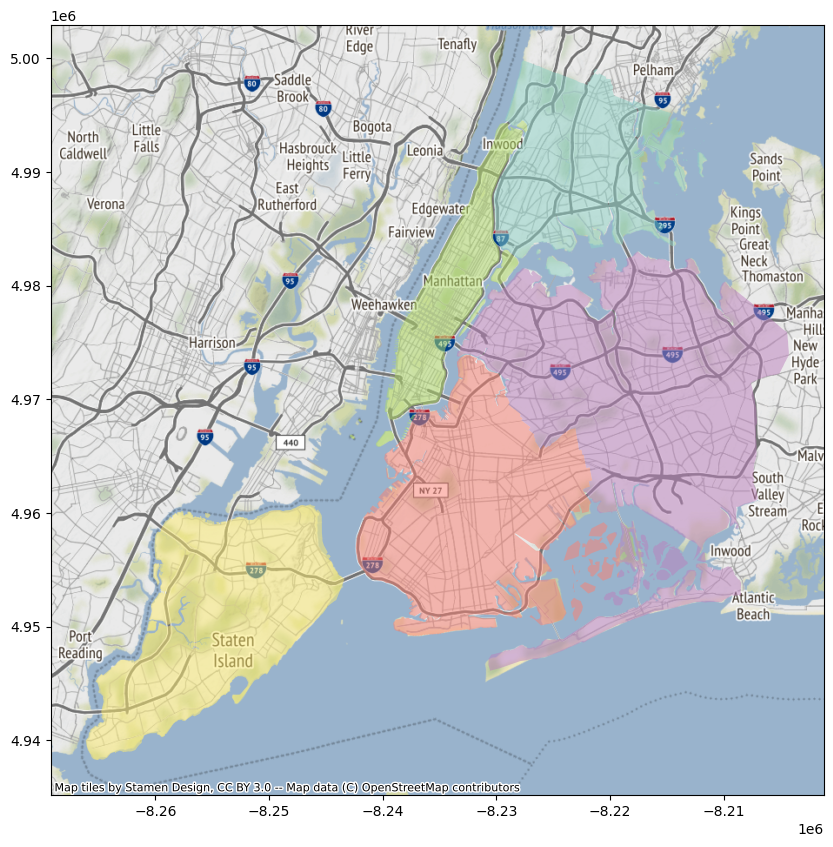

In [4]:
# Wizualizacja wszystkich dzielnic Nowego Yorku na mapie
import matplotlib.pyplot as plt
import contextily as ctx

fix, ax = plt.subplots(figsize = (14, 10))
boroughs.plot(ax = ax, column="bname", cmap="Set3", k=5, alpha=0.5)
ctx.add_basemap(ax)

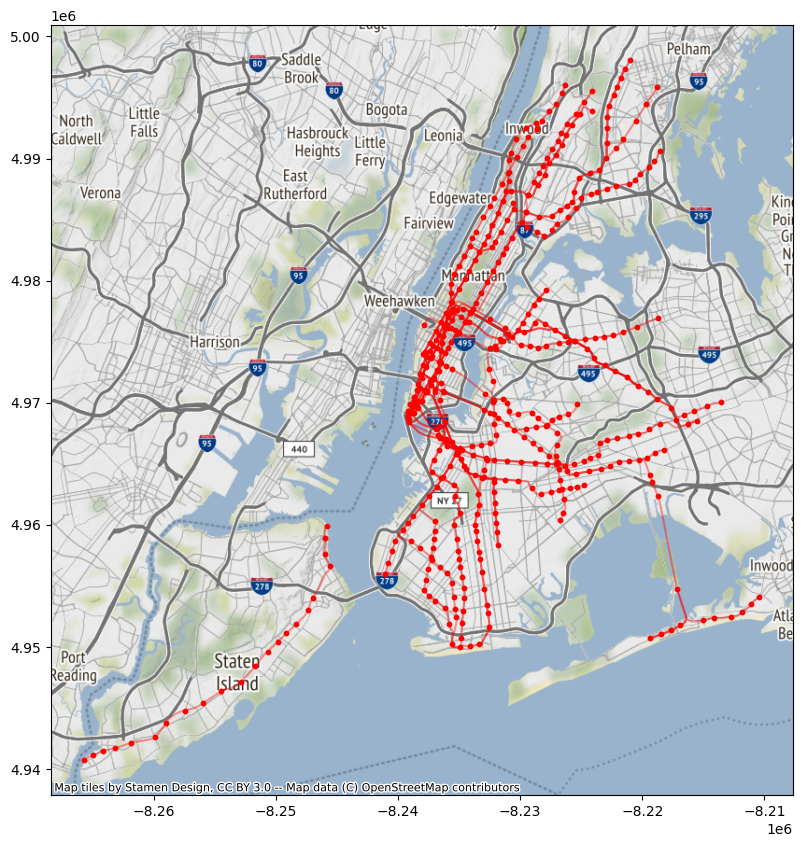

In [5]:
# Wizualizacja linii oraz przystanków metra dla Nowego Yorku na mapie
fix, ax = plt.subplots(figsize = (14, 10))
subway_routes.plot(ax = ax, color="red", alpha=0.4)
subway_stops.plot(ax = ax, color="red", markersize=10)
ctx.add_basemap(ax)

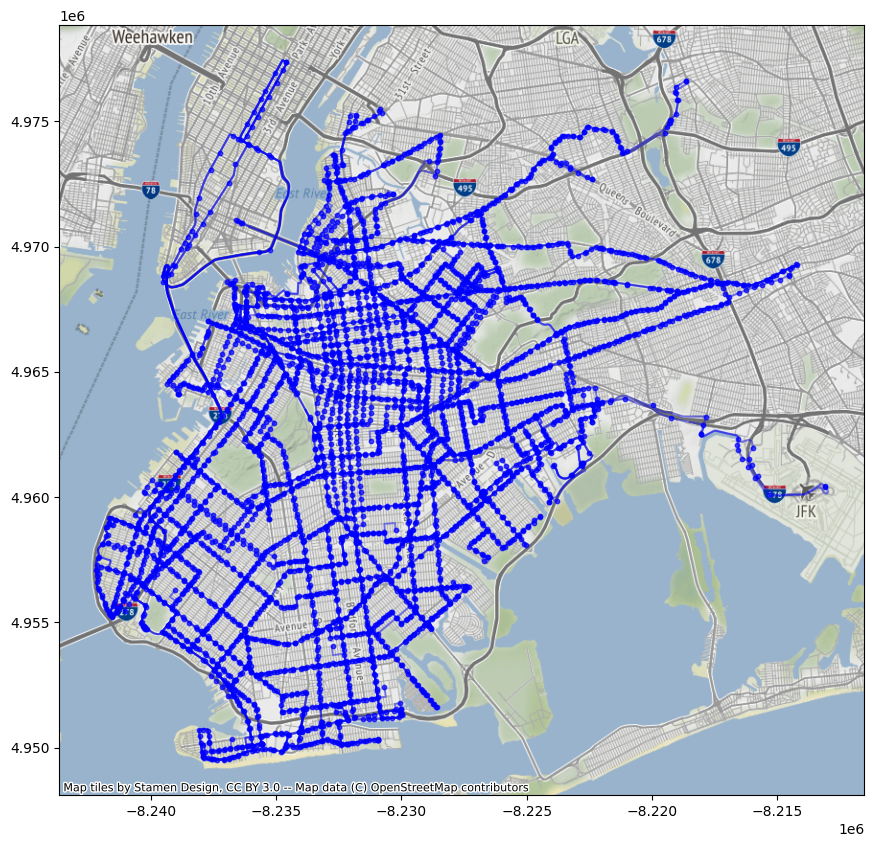

In [6]:
# Wizualizacja linii oraz przystanków autobusowych dla dzielnicy Brooklyn na mapie
fix, ax = plt.subplots(figsize = (14, 10))
bk_bus_routes.plot(ax = ax, color="blue", alpha=0.4)
bk_bus_stops.plot(ax = ax, color="blue", alpha=0.7, markersize=10)
ctx.add_basemap(ax)

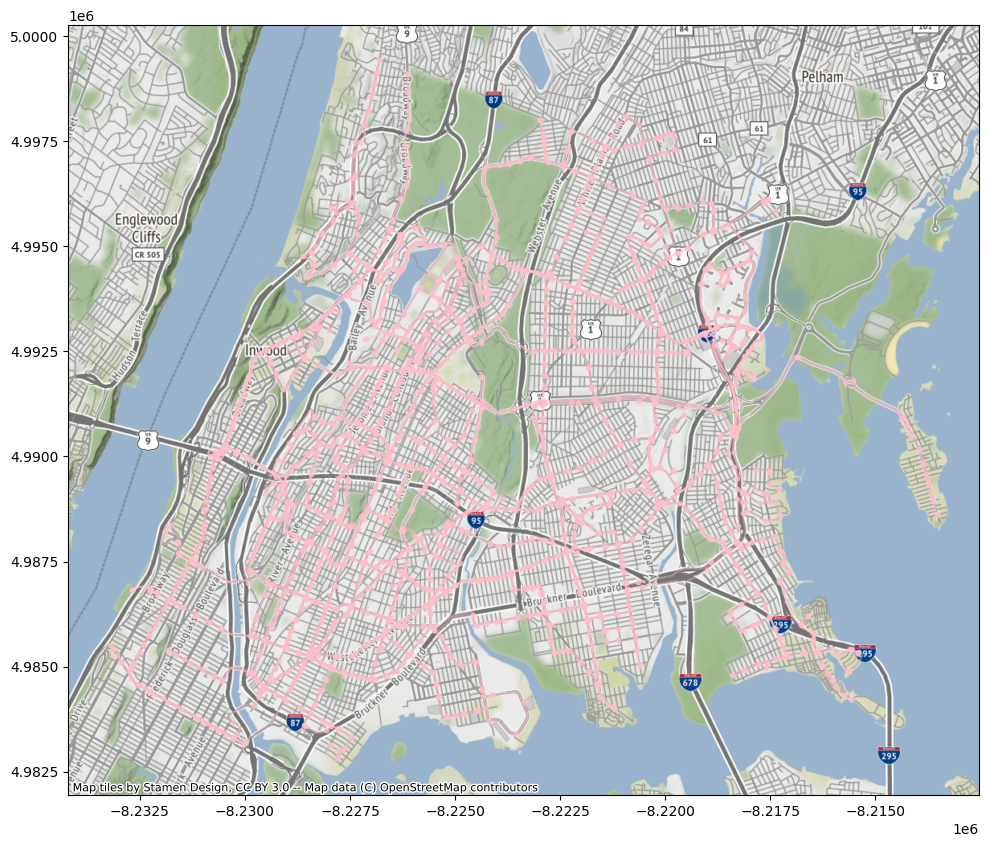

In [7]:
# Wizualizacja linii oraz przystanków autobusowych dla dzielnicy Bronx na mapie
fix, ax = plt.subplots(figsize = (14, 10))
bx_bus_routes.plot(ax = ax, color="pink", alpha=0.4)
bx_bus_stops.plot(ax = ax, color="pink", alpha=0.7, markersize=10)
ctx.add_basemap(ax)

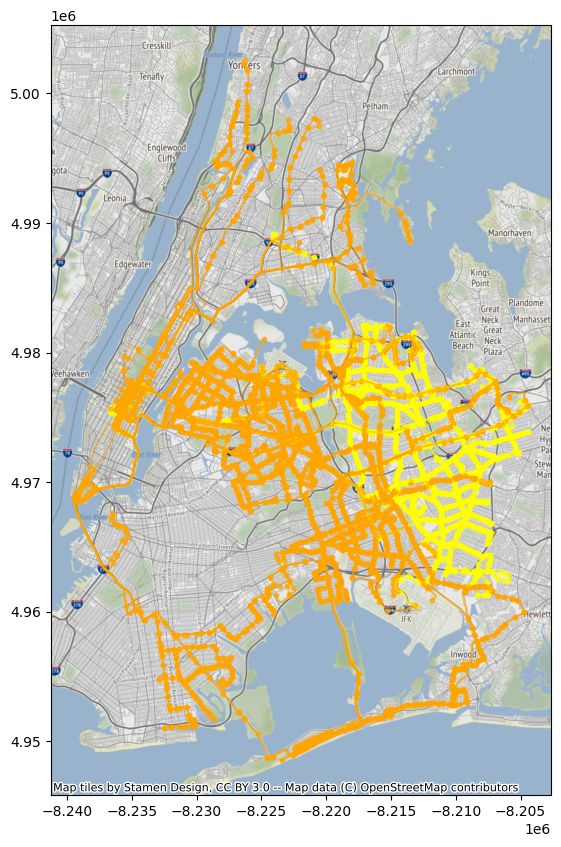

In [8]:
# Wizualizacja linii oraz przystanków autobusowych dla dzielnicy Queens na mapie
# Jeśli chodzi o tą dzielnicę to pliki do pobrania ze strony były podzielone dla dwóch części tej dzielnicy, na mapce widać ich złączenie
fix, ax = plt.subplots(figsize = (14, 10))
eq_bus_routes.plot(ax = ax, color="yellow", alpha=0.4)
wq_bus_routes.plot(ax = ax, color="orange", alpha=0.4)
eq_bus_stops.plot(ax = ax, color="yellow", alpha=0.7, markersize=10)
wq_bus_stops.plot(ax = ax, color="orange", alpha=0.7, markersize=10)
ctx.add_basemap(ax)

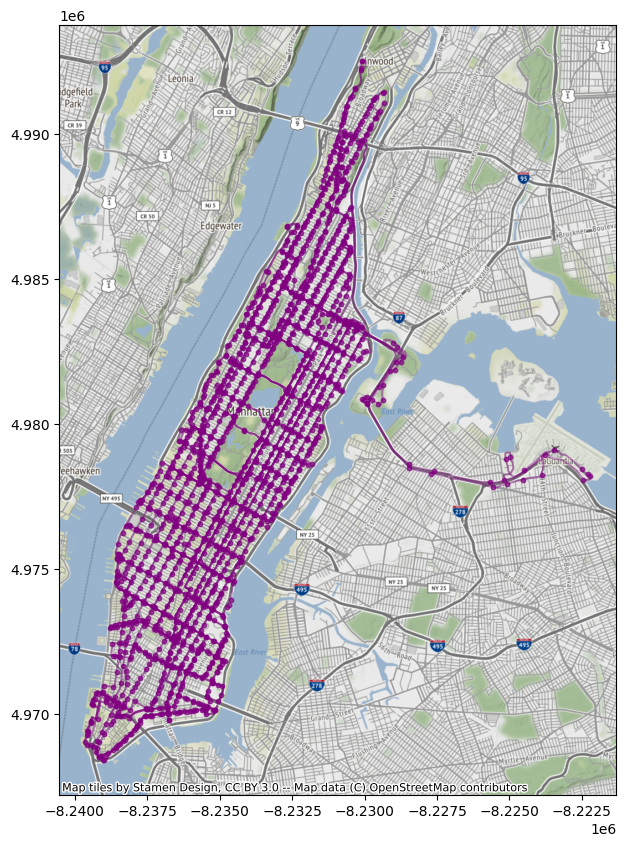

In [9]:
# Wizualizacja linii oraz przystanków autobusowych dla dzielnicy Manhattan na mapie
fix, ax = plt.subplots(figsize = (14, 10))
mn_bus_routes.plot(ax = ax, color="purple", alpha=0.4)
mn_bus_stops.plot(ax = ax, color="purple", alpha=0.7, markersize=10)
ctx.add_basemap(ax)

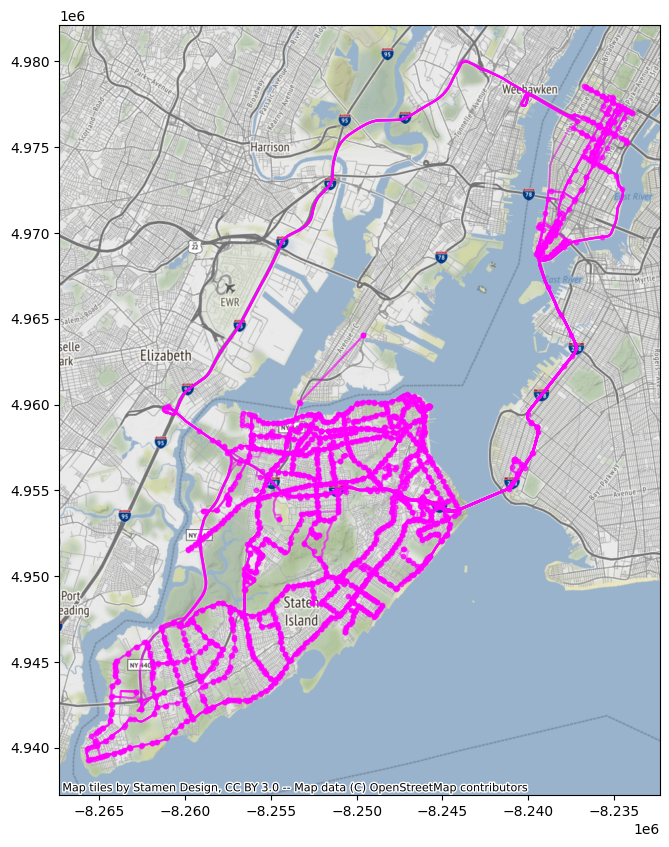

In [10]:
# Wizualizacja linii oraz przystanków autobusowych dla dzielnicy Staten Island na mapie
fix, ax = plt.subplots(figsize = (14, 10))
si_bus_routes.plot(ax = ax, color="magenta", alpha=0.4)
si_bus_stops.plot(ax = ax, color="magenta", alpha=0.7, markersize=10)
ctx.add_basemap(ax)

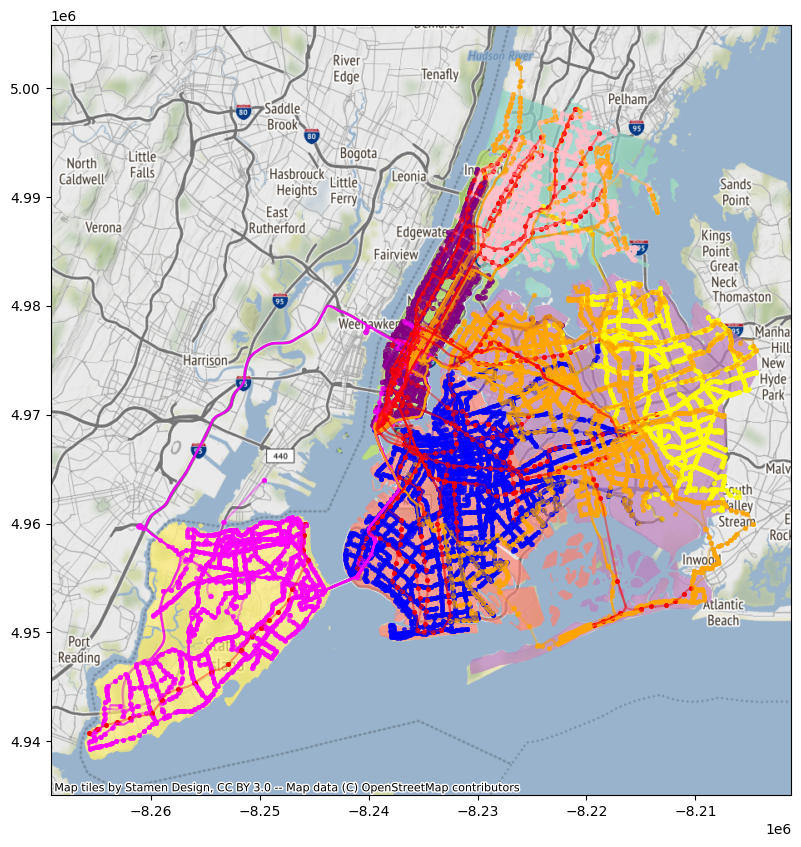

In [11]:
# Wizualizacja wszystkich zebranych danych na jednej mapie
fix, ax = plt.subplots(figsize = (14, 10))
boroughs.plot(ax = ax, column="bname", cmap="Set3", k=5, alpha=0.7)
bk_bus_routes.plot(ax = ax, color="blue", alpha=0.2)
bx_bus_routes.plot(ax = ax, color="pink", alpha=0.2)
eq_bus_routes.plot(ax = ax, color="yellow", alpha=0.2)
mn_bus_routes.plot(ax = ax, color="purple", alpha=0.2)
si_bus_routes.plot(ax = ax, color="magenta", alpha=0.2)
wq_bus_routes.plot(ax = ax, color="orange", alpha=0.2)
bk_bus_stops.plot(ax = ax, color="blue", alpha=0.7, markersize=7)
bx_bus_stops.plot(ax = ax, color="pink", alpha=0.7, markersize=7)
eq_bus_stops.plot(ax = ax, color="yellow", alpha=0.7, markersize=7)
mn_bus_stops.plot(ax = ax, color="purple", alpha=0.7, markersize=7)
si_bus_stops.plot(ax = ax, color="magenta", alpha=0.7, markersize=7)
wq_bus_stops.plot(ax = ax, color="orange", alpha=0.7, markersize=7)
subway_routes.plot(ax = ax, color="red", alpha=0.4)
subway_stops.plot(ax = ax, color="red", alpha=1, markersize=7)
ctx.add_basemap(ax)

In [12]:
# Zliczenie ilości przystanków autobusowych dla każdej z dzielnic i wpisanie tej wartości do kolumny busstopsnumber
boroughs.at[0, "busstopsnumber"] = len(bx_bus_stops)
boroughs.at[1, "busstopsnumber"] = len(bk_bus_stops)
boroughs.at[2, "busstopsnumber"] = len(mn_bus_stops)
boroughs.at[3, "busstopsnumber"] = len(eq_bus_stops) + len(wq_bus_stops)
boroughs.at[4, "busstopsnumber"] = len(si_bus_stops)

boroughs

,bcode,bname,name,namelsad,geometry,busstopsnumber
0,36005,Bronx,Bronx,Bronx County,"MULTIPOLYGON (((-8227681.005 4999853.797, -822...",2203.0
1,36047,Brooklyn,Kings,Kings County,"MULTIPOLYGON (((-8239801.806 4965193.023, -823...",4724.0
2,36061,Manhattan,New York,New York County,"MULTIPOLYGON (((-8228202.426 4994007.175, -822...",1829.0
3,36081,Queens,Queens,Queens County,"MULTIPOLYGON (((-8220574.814 4952523.984, -822...",5679.0
4,36085,Staten Island,Richmond,Richmond County,"MULTIPOLYGON (((-8259099.151 4952995.017, -825...",2078.0


In [13]:
# Zliczenie długości tras autobusowych dla każdej z dzielnic i wpisanie tej wartości do kolumny busrouteslength
bx = 0
bk = 0
mn = 0
q = 0
si = 0
for x in bx_bus_routes["geometry"]:
    bx = bx + x.length 
for x in bk_bus_routes["geometry"]:
    bk = bk + x.length 
for x in mn_bus_routes["geometry"]:
    mn = mn + x.length 
for x in eq_bus_routes["geometry"]:
    q = q + x.length 
for x in wq_bus_routes["geometry"]:
    q = q + x.length 
for x in si_bus_routes["geometry"]:
    si = si + x.length 

boroughs.at[0, "busrouteslength"] = bx
boroughs.at[1, "busrouteslength"] = bk
boroughs.at[2, "busrouteslength"] = mn
boroughs.at[3, "busrouteslength"] = q
boroughs.at[4, "busrouteslength"] = si

boroughs

,bcode,bname,name,namelsad,geometry,busstopsnumber,busrouteslength
0,36005,Bronx,Bronx,Bronx County,"MULTIPOLYGON (((-8227681.005 4999853.797, -822...",2203.0,1.134401e+06
1,36047,Brooklyn,Kings,Kings County,"MULTIPOLYGON (((-8239801.806 4965193.023, -823...",4724.0,2.003380e+06
2,36061,Manhattan,New York,New York County,"MULTIPOLYGON (((-8228202.426 4994007.175, -822...",1829.0,8.981669e+05
3,36081,Queens,Queens,Queens County,"MULTIPOLYGON (((-8220574.814 4952523.984, -822...",5679.0,5.392664e+06
4,36085,Staten Island,Richmond,Richmond County,"MULTIPOLYGON (((-8259099.151 4952995.017, -825...",2078.0,3.945823e+06


In [14]:
# Zliczenie wielkości każdej z dzielnic i wpisanie tej wartości do kolumny surfacearea
boroughs["surfacearea"] = boroughs.area
boroughs

,bcode,bname,name,namelsad,geometry,busstopsnumber,busrouteslength,surfacearea
0,36005,Bronx,Bronx,Bronx County,"MULTIPOLYGON (((-8227681.005 4999853.797, -822...",2203.0,1.134401e+06,1.915285e+08
1,36047,Brooklyn,Kings,Kings County,"MULTIPOLYGON (((-8239801.806 4965193.023, -823...",4724.0,2.003380e+06,3.193948e+08
2,36061,Manhattan,New York,New York County,"MULTIPOLYGON (((-8228202.426 4994007.175, -822...",1829.0,8.981669e+05,1.042923e+08
3,36081,Queens,Queens,Queens County,"MULTIPOLYGON (((-8220574.814 4952523.984, -822...",5679.0,5.392664e+06,4.916660e+08
4,36085,Staten Island,Richmond,Richmond County,"MULTIPOLYGON (((-8259099.151 4952995.017, -825...",2078.0,3.945823e+06,2.640685e+08


In [15]:
# Zliczenie długości tras linii metra dla każdej z dzielnic i wpisanie tej wartości do kolumny subwayrouteslength
# W przypadku gdy dana linia metra przebiega przez więcej niż jedną dzielnicę to jej długość jest wliczana do każdej, w której się zawiera
bx = 0
bk = 0
mn = 0
q = 0
si = 0
for x in subway_routes["geometry"]:
    if boroughs.at[0, "geometry"].intersects(x):
        bx = bx + x.length 
    if boroughs.at[1, "geometry"].intersects(x):
        bk = bk + x.length 
    if boroughs.at[2, "geometry"].intersects(x):
        mn = mn + x.length 
    if boroughs.at[3, "geometry"].intersects(x):
        q = q + x.length 
    if boroughs.at[4, "geometry"].intersects(x):
        si = si + x.length 

boroughs.at[0, "subwayrouteslength"] = bx
boroughs.at[1, "subwayrouteslength"] = bk
boroughs.at[2, "subwayrouteslength"] = mn
boroughs.at[3, "subwayrouteslength"] = q
boroughs.at[4, "subwayrouteslength"] = si

boroughs

,bcode,bname,name,namelsad,geometry,busstopsnumber,busrouteslength,surfacearea,subwayrouteslength
0,36005,Bronx,Bronx,Bronx County,"MULTIPOLYGON (((-8227681.005 4999853.797, -822...",2203.0,1.134401e+06,1.915285e+08,324664.366148
1,36047,Brooklyn,Kings,Kings County,"MULTIPOLYGON (((-8239801.806 4965193.023, -823...",4724.0,2.003380e+06,3.193948e+08,712568.837789
2,36061,Manhattan,New York,New York County,"MULTIPOLYGON (((-8228202.426 4994007.175, -822...",1829.0,8.981669e+05,1.042923e+08,826540.697150
3,36081,Queens,Queens,Queens County,"MULTIPOLYGON (((-8220574.814 4952523.984, -822...",5679.0,5.392664e+06,4.916660e+08,412934.887142
4,36085,Staten Island,Richmond,Richmond County,"MULTIPOLYGON (((-8259099.151 4952995.017, -825...",2078.0,3.945823e+06,2.640685e+08,30384.964821


In [16]:
# Zliczenie ilości przystanków linii metra dla każdej z dzielnic i wpisanie tej wartości do kolumny subwaystopsnumber
bx = 0
bk = 0
mn = 0
q = 0
si = 0
for x in subway_stops["geometry"]:
    if boroughs.at[0, "geometry"].contains(x):
        bx = bx + 1 
    if boroughs.at[1, "geometry"].contains(x):
        bk = bk + 1 
    if boroughs.at[2, "geometry"].contains(x):
        mn = mn + 1 
    if boroughs.at[3, "geometry"].contains(x):
        q = q + 1 
    if boroughs.at[4, "geometry"].contains(x):
        si = si + 1 

boroughs.at[0, "subwaystopsnumber"] = bx
boroughs.at[1, "subwaystopsnumber"] = bk
boroughs.at[2, "subwaystopsnumber"] = mn
boroughs.at[3, "subwaystopsnumber"] = q
boroughs.at[4, "subwaystopsnumber"] = si

boroughs

,bcode,bname,name,namelsad,geometry,busstopsnumber,busrouteslength,surfacearea,subwayrouteslength,subwaystopsnumber
0,36005,Bronx,Bronx,Bronx County,"MULTIPOLYGON (((-8227681.005 4999853.797, -822...",2203.0,1.134401e+06,1.915285e+08,324664.366148,70.0
1,36047,Brooklyn,Kings,Kings County,"MULTIPOLYGON (((-8239801.806 4965193.023, -823...",4724.0,2.003380e+06,3.193948e+08,712568.837789,169.0
2,36061,Manhattan,New York,New York County,"MULTIPOLYGON (((-8228202.426 4994007.175, -822...",1829.0,8.981669e+05,1.042923e+08,826540.697150,148.0
3,36081,Queens,Queens,Queens County,"MULTIPOLYGON (((-8220574.814 4952523.984, -822...",5679.0,5.392664e+06,4.916660e+08,412934.887142,82.0
4,36085,Staten Island,Richmond,Richmond County,"MULTIPOLYGON (((-8259099.151 4952995.017, -825...",2078.0,3.945823e+06,2.640685e+08,30384.964821,22.0


In [17]:
# W tym miejscu zostaje wyliczona wartość, która ma ułatwić wyłonienie dzielnicy, która jest najlepiej skomunikowana przez komunikację miejską
# Jej analiza odbędzie się na końcu projektu
boroughs["communicationfacilities"] = boroughs["busstopsnumber"]*boroughs["busrouteslength"]*boroughs["subwayrouteslength"]*boroughs["subwaystopsnumber"]/boroughs["surfacearea"]**4
boroughs

,bcode,bname,name,namelsad,geometry,busstopsnumber,busrouteslength,surfacearea,subwayrouteslength,subwaystopsnumber,communicationfacilities
0,36005,Bronx,Bronx,Bronx County,"MULTIPOLYGON (((-8227681.005 4999853.797, -822...",2203.0,1.134401e+06,1.915285e+08,324664.366148,70.0,4.220656e-17
1,36047,Brooklyn,Kings,Kings County,"MULTIPOLYGON (((-8239801.806 4965193.023, -823...",4724.0,2.003380e+06,3.193948e+08,712568.837789,169.0,1.095155e-16
2,36061,Manhattan,New York,New York County,"MULTIPOLYGON (((-8228202.426 4994007.175, -822...",1829.0,8.981669e+05,1.042923e+08,826540.697150,148.0,1.698590e-15
3,36081,Queens,Queens,Queens County,"MULTIPOLYGON (((-8220574.814 4952523.984, -822...",5679.0,5.392664e+06,4.916660e+08,412934.887142,82.0,1.774556e-17
4,36085,Staten Island,Richmond,Richmond County,"MULTIPOLYGON (((-8259099.151 4952995.017, -825...",2078.0,3.945823e+06,2.640685e+08,30384.964821,22.0,1.127192e-18


In [18]:
# Wyznaczenie centrów każdej z dzielnic i wpisanie tej wartości do kolumny centre
boroughs["centre"] = boroughs["geometry"].centroid
boroughs

,bcode,bname,name,namelsad,geometry,busstopsnumber,busrouteslength,surfacearea,subwayrouteslength,subwaystopsnumber,communicationfacilities,centre
0,36005,Bronx,Bronx,Bronx County,"MULTIPOLYGON (((-8227681.005 4999853.797, -822...",2203.0,1.134401e+06,1.915285e+08,324664.366148,70.0,4.220656e-17,POINT (-8222801.466 4990627.467)
1,36047,Brooklyn,Kings,Kings County,"MULTIPOLYGON (((-8239801.806 4965193.023, -823...",4724.0,2.003380e+06,3.193948e+08,712568.837789,169.0,1.095155e-16,POINT (-8231674.594 4960014.459)
2,36061,Manhattan,New York,New York County,"MULTIPOLYGON (((-8228202.426 4994007.175, -822...",1829.0,8.981669e+05,1.042923e+08,826540.697150,148.0,1.698590e-15,POINT (-8233981.846 4979568.503)
3,36081,Queens,Queens,Queens County,"MULTIPOLYGON (((-8220574.814 4952523.984, -822...",5679.0,5.392664e+06,4.916660e+08,412934.887142,82.0,1.774556e-17,POINT (-8217369.819 4969329.001)
4,36085,Staten Island,Richmond,Richmond County,"MULTIPOLYGON (((-8259099.151 4952995.017, -825...",2078.0,3.945823e+06,2.640685e+08,30384.964821,22.0,1.127192e-18,POINT (-8254627.083 4950735.099)


In [19]:
# Utworzenie markerów dla centrów każdej z dzielnic na mapie interaktywnej
import folium

boroughs_centre = folium.features.GeoJson(boroughs["centre"], name = "Boroughs")

m = folium.Map(location = [40.75, -74], zoom_start=10)
boroughs_centre.add_to(m)
m

In [20]:
# Wizualizacja każdej z dzielnic na mapie interaktywnej
from folium.plugins import MarkerCluster

boroughs_area = folium.features.GeoJson(boroughs["geometry"], name = "Boroughs")

m = folium.Map(location = [40.75, -74], zoom_start=10)

boroughs_area.add_to(m)
m

In [21]:
# Podsumowując analizę można zauważyć, że najlepiej skomunikowaną jeśli chodzi o komunikację miejską jest dzielnica Manhattan
# Co ciekawe nie posiada ona najwięcej stacji metra czy przystanków, a nawet ze wszystkich dzielnic ma najkrótszą sumę tras autobusowych
# Jednak z racji, że jest to najmniejsza z dzielnic Nowego Yorku, w przeliczeniu na powierzchnie okazuję się być znacznie lepiej skomunikowana od pozostałych
# Z kolei najgorzej skomunikowana jest dzielnica-wyspa, a konkretnie Staten Island, która w przeliczeniu na powierzchnie dość mocno odstaje od reszty dzielnic
# W prawdzie w danych nie ma informacji o populacji każdej z dzielnic jednak ze źródeł internetowych wiadomo
# Że Staten Island jest najmniej zaludniony co mogłoby wytłumaczyć najmniejszą wartość communicationfacilities